In [3]:
from hidrocomp.iha.iha import IHA
from hidrocomp.iha.graphics import Graphics
import pandas as pd
import plotly as py
from hidrocomp.series.flow import Flow
from simulation import Simulation

In [4]:
file = "../Medicoes/PIMENTAL.csv"
data = pd.read_csv(file, ',', index_col=0, parse_dates=True)
flow = Flow(data=data, source='ONS', station="PIMENTAL")
flow.station = "Natural"
flow.data = flow.data.rename(columns={"PIMENTAL": "Natural"})
month = flow.month_start_year_hydrologic()
date_start = flow.date_start.replace(day=1, month=month[2]) #date_start=01/03/1970
date_end = flow.date_end.replace(day=31, month=month[0]-1) #date_end=31/08/2018
flow.date(date_start=date_start, date_end=date_end) #data range definition

threshold_high=11749.49
threshold_low=1397.0
mxt_flow = 13950 # Maximum turbochargeable flow
simulation = Simulation(data=flow, mxt_flow=mxt_flow)

In [5]:
scenery_recovery_harsh = simulation.rule_01()

In [6]:
#Remover ano de 2016
date_start_del = pd.to_datetime("01/09/2015", dayfirst=True)
date_end_del = pd.to_datetime("31/08/2016", dayfirst=True)
data_del = pd.date_range(date_start_del, date_end_del, freq='D').values
month_water = flow.month_start_year_hydrologic()[0]
scenery_recovery_harsh_del = scenery_recovery_harsh[0].drop(data_del)
data_tvr_scenery_recovery_harsh = pd.DataFrame(scenery_recovery_harsh_del.TVR)
data_natural = pd.DataFrame(scenery_recovery_harsh_del.Natural)
scenery_recovery_harsh_del

,TVR,Derivation channel,Natural,e-flow
1970-03-01,5077.47,6070.53,11148.00,5077.47
1970-03-02,5219.09,6489.91,11709.00,5219.09
1970-03-03,5183.96,7290.04,12474.00,5183.96
1970-03-04,4944.21,8407.79,13352.00,4944.21
1970-03-05,4815.05,9316.95,14132.00,4815.05
...,...,...,...,...
2018-08-27,713.45,400.55,1114.00,713.45
2018-08-28,704.54,421.72,1126.26,704.54
2018-08-29,692.30,470.00,1162.30,692.30
2018-08-30,666.03,553.20,1219.23,666.03


# Natural

In [7]:
iha_natural = IHA(data_natural, month_water=month_water, status='pre', statistic='non-parametric', central_metric='mean', 
                                      variation_metric='cv',  type_criterion=None, type_threshold="stationary", duration=0,
                                      threshold_high=threshold_high, threshold_low=threshold_low, source="ONS", station='Natural')

## Magnitude - Natural

In [8]:
mag_data_natural, mag_metric_natural = iha_natural.magnitude()
mag_metric_natural

,Coeff. of Var.,Means
1,0.392182,8474.805196
2,0.296751,13595.118052
3,0.246704,18842.015585
4,0.186708,19316.175764
5,0.312303,14413.711183
6,0.368970,6740.406861
7,0.279928,3028.636694
8,0.222776,1646.830961
9,0.207582,1123.527816
10,0.273590,1164.067481


## Frequency and Duration - Natural

In [9]:
freq_dur_data_natural, freq_dur_metric_natural, partial_high_natural, partial_low_natural = iha_natural.frequency_and_duration()
freq_dur_metric_natural

,Coeff. of Var.,Means
High pulse count,0.410759,1.183673
High pulse duration,0.360865,95.336806
Low pulse count,0.559491,1.354167
Low pulse duration,0.540026,59.431159


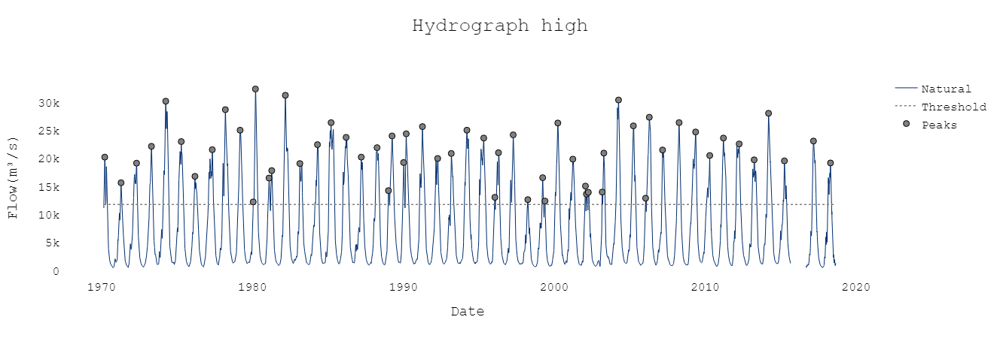

In [10]:
fig_partial_high_natural, data_fig_partial_high_natural = partial_high_natural.hydrogram(title="Hydrograph high", color={"Natural": "#002e6f"})

del data_fig_partial_high_natural[2]
del data_fig_partial_high_natural[2]

py.offline.iplot(fig_partial_high_natural)

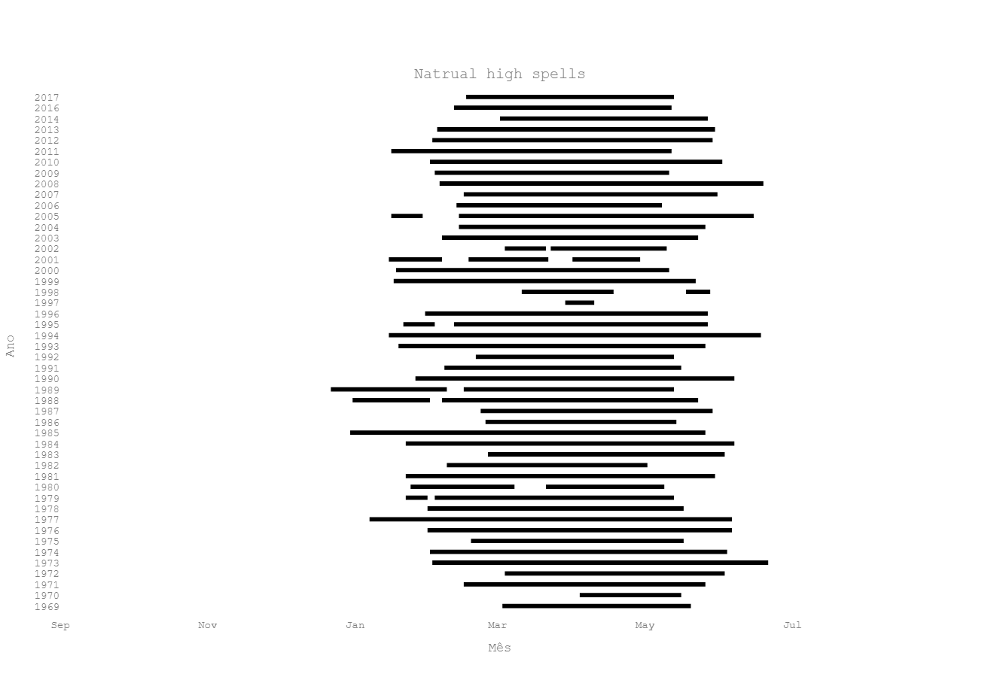

In [11]:
fig_spells_natural, fig_data_spells_natural = partial_high_natural.plot_spells(title="Natrual high spells")
py.offline.iplot(fig_spells_natural)

In [12]:
from plotly.subplots import make_subplots
import plotly.graph_objs as go

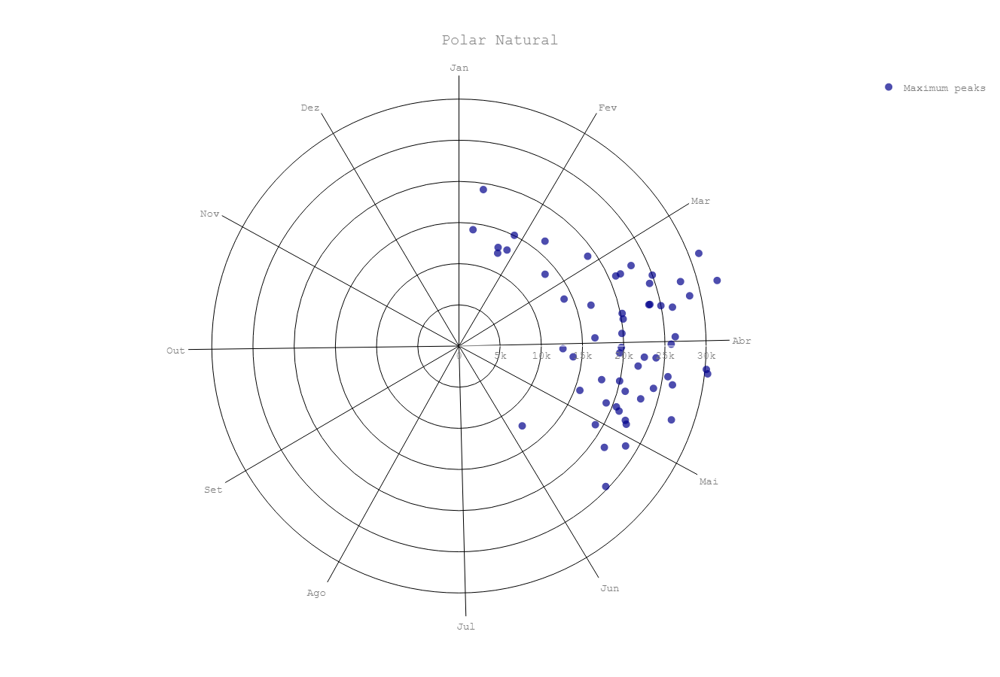

In [13]:
fig_polar_natural_high, fig_polar_data_natural_high = partial_high_natural.polar(title="Polar Natural", color="#00008B")
fig_polar_natural_low, fig_polar_data_natural_low = partial_low_natural.polar(title="Polar Natural", color="#FF4500")

py.offline.iplot(fig_polar_natural_high)

## Magnitude e Duration - Natural

In [14]:
mag_dur_data_natural, mag_dur_metric_natural  = iha_natural.magnitude_and_duration()
mag_dur_metric_natural

,Coeff. of Var.,Means
1-day maximum,0.188254,22683.280625
1-day minimum,0.232869,954.459583
3-day maximum,0.188484,22629.711458
3-day minimum,0.232075,961.695764
30-day maximum,0.192839,21263.414014
30-day minimum,0.229731,1034.722812
7-day maximum,0.188808,22492.006101
7-day minimum,0.230977,973.605060
90-day maximum,0.192929,18362.979604
90-day minimum,0.248873,1262.210157


## Timing Extreme

In [15]:
timing_data_natural, timing_metric_natural = iha_natural.timing_extreme()
timing_metric_natural

,Coeff. of Var.,Means
Date of maximum,0.224444,92.375000
Date of minimum,0.151845,264.520833


## Rate and Frequency

In [16]:
rate_freq_data_natural, rate_freq_metric_natural = iha_natural.rate_and_frequency()
rate_freq_metric_natural

,Coeff. of Var.,Means
Rise rate,0.291183,203.140320
Fall rate,-0.170759,-149.281413
Number of reversals,0.356344,48.959184


# Scenery 01: Recovery Harsh

In [17]:
iha_sim_scenery_recovery_harsh = IHA(data_tvr_scenery_recovery_harsh, month_water=month_water, status='pos', statistic='non-parametric', central_metric='mean',
                                      variation_metric='cv',  type_criterion=None, type_threshold="stationary", duration=0,
                                      threshold_high=threshold_high, threshold_low=threshold_low, source="ONS", station='TVR - Recovery Harsh')

## Magnitude

In [18]:
mag_data_scenery_recovery_harsh, mag_metric_scenery_recovery_harsh = iha_sim_scenery_recovery_harsh.magnitude()
mag_metric_scenery_recovery_harsh

,Coeff. of Var.,Means
1,1.586669e-01,2392.333205
2,1.189363e-01,6166.270005
3,2.297759e-01,8451.932964
4,5.914675e-02,10867.129590
5,1.663859e-01,6786.288172
6,3.157397e-02,2785.607236
7,5.658546e-03,1399.815423
8,5.714407e-16,804.212258
9,1.246539e-01,996.888879
10,9.581327e-02,845.066452


## Frequency and Duration

In [19]:
freq_dur_data_scenery_recovery_harsh, freq_dur_metric_scenery_recovery_harsh, partial_high_scenery_recovery_harsh, partial_low_scenery_recovery_harsh = iha_sim_scenery_recovery_harsh.frequency_and_duration()
freq_dur_metric_scenery_recovery_harsh

,Coeff. of Var.,Means
High pulse count,1.977336,0.270833
High pulse duration,0.719504,18.409091
Low pulse count,0.234556,1.958333
Low pulse duration,0.293391,76.148936


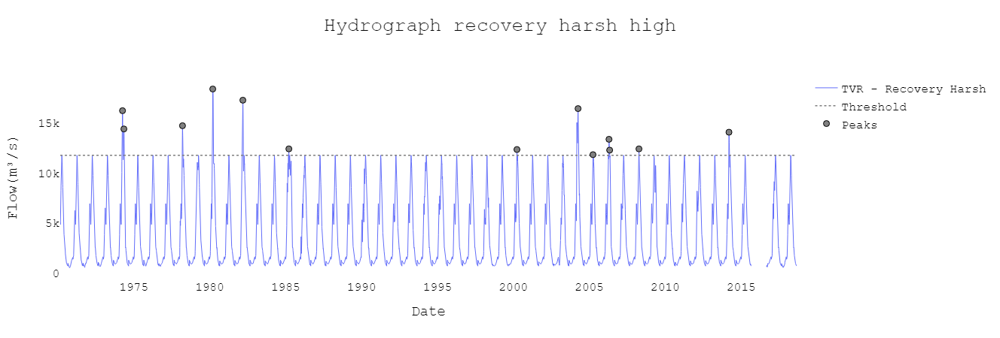

In [20]:
fig_partial_high_scenery_recovery_harsh, data_fig_partial_high_scenery_recovery_harsh = partial_high_scenery_recovery_harsh.hydrogram(title="Hydrograph recovery harsh high", color={"Natural": "#002e6f"})

del data_fig_partial_high_scenery_recovery_harsh[2]
del data_fig_partial_high_scenery_recovery_harsh[2]

layout = fig_partial_high_scenery_recovery_harsh['layout']

fig_partial_high_scenery_recovery_harsh_del = dict(data=data_fig_partial_high_scenery_recovery_harsh, layout=layout)

py.offline.iplot(fig_partial_high_scenery_recovery_harsh_del)

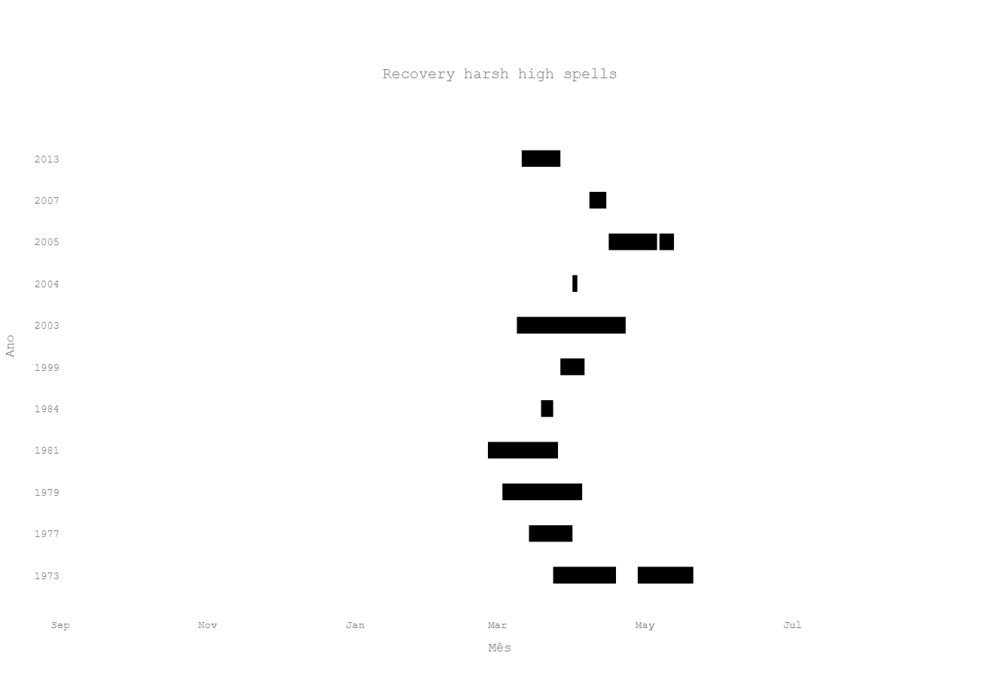

In [21]:
fig_spells_scenery_recovery_harsh, fig_data_spells_scenery_recovery_harsh = partial_high_scenery_recovery_harsh.plot_spells(title="Recovery harsh high spells")
py.offline.iplot(fig_spells_scenery_recovery_harsh)

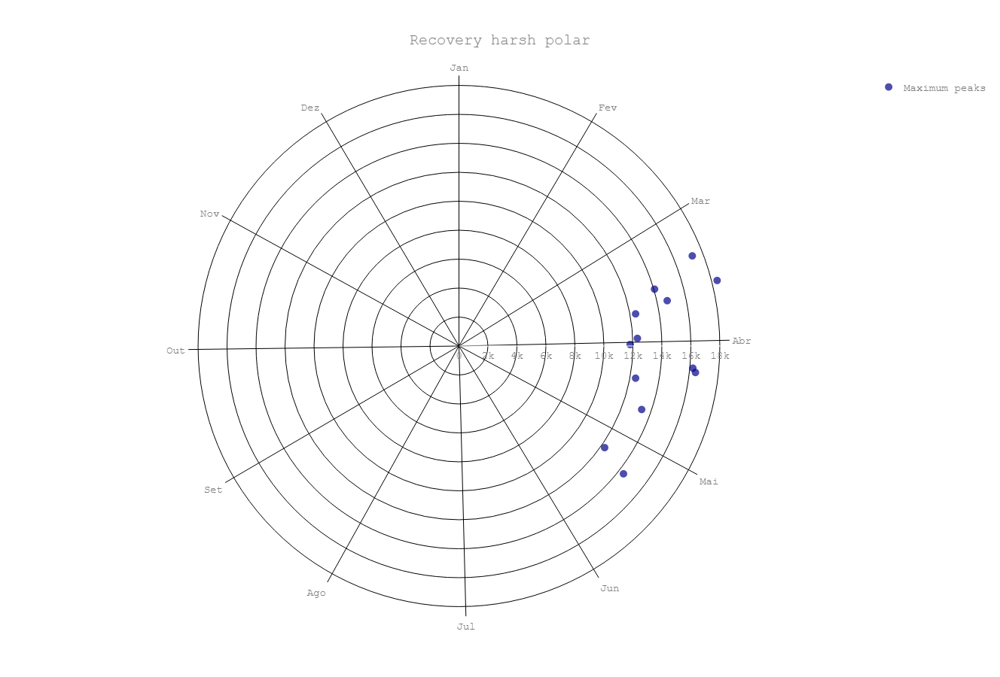

In [22]:
fig_polar_scenery_recovery_harsh_high, fig_polar_data_scenery_recovery_harsh_high = partial_high_scenery_recovery_harsh.polar(title="Recovery harsh polar", color="#00008B")
fig_polar_scenery_recovery_harsh_low, fig_polar_data_scenery_recovery_harsh_low = partial_low_scenery_recovery_harsh.polar(title="Recovery harsh polar", color="#FF4500")

py.offline.iplot(fig_polar_scenery_recovery_harsh_high)

## Magnitude e Duration

In [23]:
mag_dur_data_scenery_recovery_harsh, mag_dur_metric_scenery_recovery_harsh  = iha_sim_scenery_recovery_harsh.magnitude_and_duration()
mag_dur_metric_scenery_recovery_harsh

,Coeff. of Var.,Means
1-day maximum,0.126391,12375.440208
1-day minimum,0.062420,648.295000
3-day maximum,0.129462,12260.196597
3-day minimum,0.063427,658.938125
30-day maximum,0.106404,11361.491306
30-day minimum,0.080493,771.261486
7-day maximum,0.130333,12104.479970
7-day minimum,0.065908,681.531548
90-day maximum,0.108611,8898.717009
90-day minimum,0.136198,894.029185


## Timing Extreme

In [24]:
timing_data_scenery_recovery_harsh, timing_metric_scenery_recovery_harsh = iha_sim_scenery_recovery_harsh.timing_extreme()
timing_metric_scenery_recovery_harsh

,Coeff. of Var.,Means
Date of maximum,0.078301,96.666667
Date of minimum,0.059336,249.666667


## Rate and Frequency

In [25]:
rate_freq_data_scenery_recovery_harsh, rate_freq_metric_scenery_recovery_harsh = iha_sim_scenery_recovery_harsh.rate_and_frequency()
rate_freq_metric_scenery_recovery_harsh

,Coeff. of Var.,Means
Rise rate,0.140742,103.376476
Fall rate,-0.118386,-84.020863
Number of reversals,0.192361,64.530612


## Polar Natural x Naturally Harsh

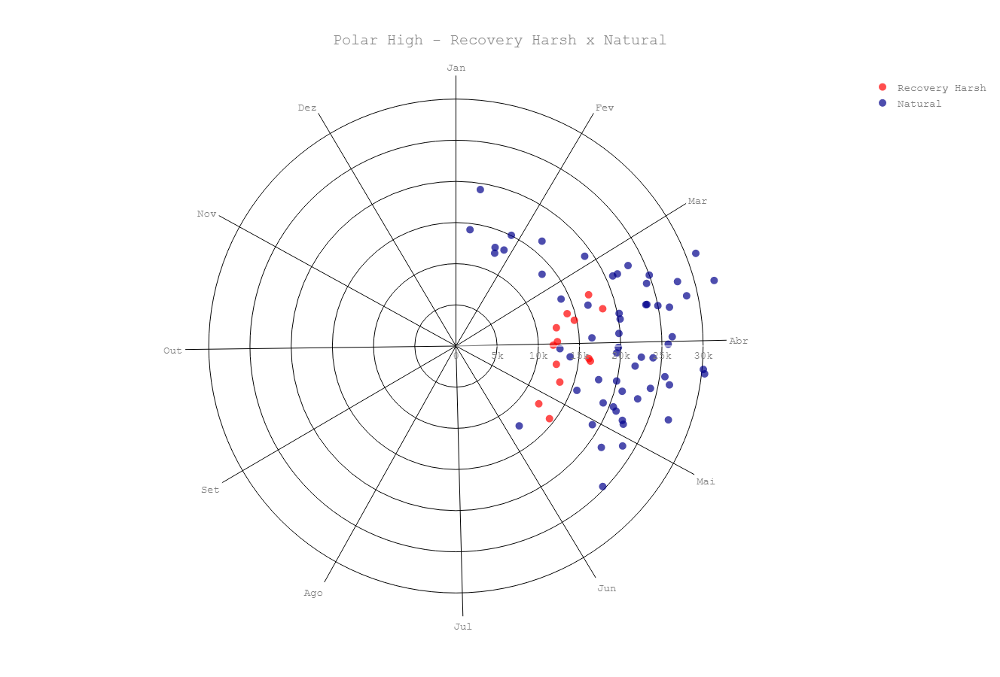

In [26]:
layout=fig_polar_scenery_recovery_harsh_high['layout']

layout['title']['text'] = "Polar High - Recovery Harsh x Natural"
fig_polar_data_scenery_recovery_harsh_high[0]['marker']['color'] = "red"
fig_polar_data_scenery_recovery_harsh_high[0]['name'] = "Recovery Harsh"
fig_polar_data_natural_high[0]['name'] = "Natural"
fig_polar_natural_scenery_recovery_harsh = dict(data=fig_polar_data_scenery_recovery_harsh_high+[fig_polar_data_natural_high[0]], layout=layout)

py.offline.iplot(fig_polar_natural_scenery_recovery_harsh)